##  Problem Statement
**Building recommendation system for books:**
*A Collaborative Filtering, that recommends items based on reactions by similar users.*

## Executive Summary
*Aggregating ratings of books, recognizing commonalities between the users based on their ratings, and generate new recommendations based on comparisons between users.*

### Contents:
- [Datasets Description](#Datasets-Description)
- [Data Import & Cleaning](#Data-Import-and-Cleaning)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Data Visualization](#Visualize-the-data)
- [Recommender System](#Recommender-System)
- [Conclusions and Recommendations](#Conclusions-and-Recommendations)

**All libraries used , including any Jupyter magic commands**

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

from scipy.sparse import csr_matrix
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors

## Datasets Description
**Book-Crossing Dataset:**
- BX-Books Contains the books.[ISBN, Book-Title, Book-Author, Year-Of-Publication, Publisher]

- BX-Users: Contains the users.[User-ID, Location, Age]

- BX-Book-Ratings: Contains the book rating information.[Book-Rating]



## Data Import and Cleaning


####  Reading In  Data

In [3]:
books = pd.read_csv('BX-CSV-Dump/BX-Books.csv',sep=';',error_bad_lines=False,encoding='latin-1')
users = pd.read_csv('BX-CSV-Dump/BX-Users.csv',sep=';',error_bad_lines=False,encoding='latin-1')
rating = pd.read_csv('BX-CSV-Dump/BX-Book-Ratings.csv',sep=';',error_bad_lines=False,encoding='latin-1')

b'Skipping line 6452: expected 8 fields, saw 9\nSkipping line 43667: expected 8 fields, saw 10\nSkipping line 51751: expected 8 fields, saw 9\n'
b'Skipping line 92038: expected 8 fields, saw 9\nSkipping line 104319: expected 8 fields, saw 9\nSkipping line 121768: expected 8 fields, saw 9\n'
b'Skipping line 144058: expected 8 fields, saw 9\nSkipping line 150789: expected 8 fields, saw 9\nSkipping line 157128: expected 8 fields, saw 9\nSkipping line 180189: expected 8 fields, saw 9\nSkipping line 185738: expected 8 fields, saw 9\n'
b'Skipping line 209388: expected 8 fields, saw 9\nSkipping line 220626: expected 8 fields, saw 9\nSkipping line 227933: expected 8 fields, saw 11\nSkipping line 228957: expected 8 fields, saw 10\nSkipping line 245933: expected 8 fields, saw 9\nSkipping line 251296: expected 8 fields, saw 9\nSkipping line 259941: expected 8 fields, saw 9\nSkipping line 261529: expected 8 fields, saw 9\n'
/Users/roaaalbader/opt/anaconda3/lib/python3.7/site-packages/IPython/core/

In [4]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', -1)

#### Displaying data

In [5]:
books.head(2)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0195153448.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0195153448.01.LZZZZZZZ.jpg
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.THUMBZZZ.jpg,http://images.amazon.com/images/P/0002005018.01.MZZZZZZZ.jpg,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg


In [6]:
rating.head(2)

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5


In [7]:
users.head(2)

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0


####  Briefly describing the data

- User-ID {the id for each user}
- ISBN {International Standard Book Number}
- Book-Title {book titles}
- Book-Author {name of the authors}
- Year-Of-Publication {the years the book published in}	
- Publisher {publisher name}
- Book-Rating {the rating for each book from 0 to 10}
- Location {country, city }
- Age {the age for each user}

**Dropping unnecessary columns**

In [8]:
books.drop(['Image-URL-S','Image-URL-M','Image-URL-L'],axis=1,inplace=True)

**Merging necessary datasets**

*the book dataset contains only book related information, we need the user id and rating for each book*

In [9]:
books_data = pd.merge(books, rating, on='ISBN')

In [10]:
books_data['Age'] = users['Age']

In [11]:
books_data.dropna(inplace=True)

#### Displaying data

In [12]:
books_data.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Age
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,18.0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,11676,8,17.0
5,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,67544,8,61.0
9,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,123629,9,26.0
10,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,177458,0,14.0


*Viewing the number of observations and features*

In [13]:
books_data.shape

(168096, 8)

*Checking the type for each feature*

In [14]:
books_data.dtypes

ISBN                   object 
Book-Title             object 
Book-Author            object 
Year-Of-Publication    object 
Publisher              object 
User-ID                int64  
Book-Rating            int64  
Age                    float64
dtype: object

In [15]:
books_data = books_data.astype({"Age":'int64'}) 

*Checking  the unique values for each feature.*

In [16]:
books_data['Age'].unique()

array([ 18,  17,  61,  26,  14,  25,  19,  46,  55,  32,  24,  20,  34,
        23,  51,  31,  21,  44,  30,  57,  43,  37,  41,  54,  42,  50,
        39,  53,  47,  36,  28,  35,  13,  58,  49,  38,  45,  62,  63,
        27,  33,  29,  66,  40,  15,  60,   0,  79,  22,  16,  65,  59,
        48,  72,  56,  67,   1,  80,  52,  69,  71,  73,  78,   9,  64,
       103, 104,  12,  74,  75, 231,   3,  76,  83,  68, 119,  11,  77,
         2,  70,  93,   8,   7,   4,  81, 114, 230, 239,  10,   5, 148,
       151,   6, 101, 201,  96,  84,  82,  90, 123, 244, 133,  91, 128,
        94,  85, 141, 110,  97, 219,  86, 124,  92, 175, 172, 209, 212,
       237,  87, 162, 100, 156, 136,  95,  89, 106,  99, 108, 210,  88,
       199, 147, 168, 132, 159, 186, 152, 102, 116, 200, 115, 226, 137,
       207, 229, 138, 109, 105, 228, 183, 204,  98, 223, 113, 208, 107,
       157, 111, 146, 118, 220, 143, 140, 189, 127])

*age column has some very high values, to fix it we drop the high and very low values*

In [17]:
books_data.drop(books_data[books_data['Age'] > 100 ].index, inplace = True)
books_data.drop(books_data[books_data['Age'] < 4 ].index, inplace = True)

In [18]:
books_data['Age'].unique()

array([ 18,  17,  61,  26,  14,  25,  19,  46,  55,  32,  24,  20,  34,
        23,  51,  31,  21,  44,  30,  57,  43,  37,  41,  54,  42,  50,
        39,  53,  47,  36,  28,  35,  13,  58,  49,  38,  45,  62,  63,
        27,  33,  29,  66,  40,  15,  60,  79,  22,  16,  65,  59,  48,
        72,  56,  67,  80,  52,  69,  71,  73,  78,   9,  64,  12,  74,
        75,  76,  83,  68,  11,  77,  70,  93,   8,   7,   4,  81,  10,
         5,   6,  96,  84,  82,  90,  91,  94,  85,  97,  86,  92,  87,
       100,  95,  89,  99,  88,  98])

*age most of the user ages between 20 and 40*

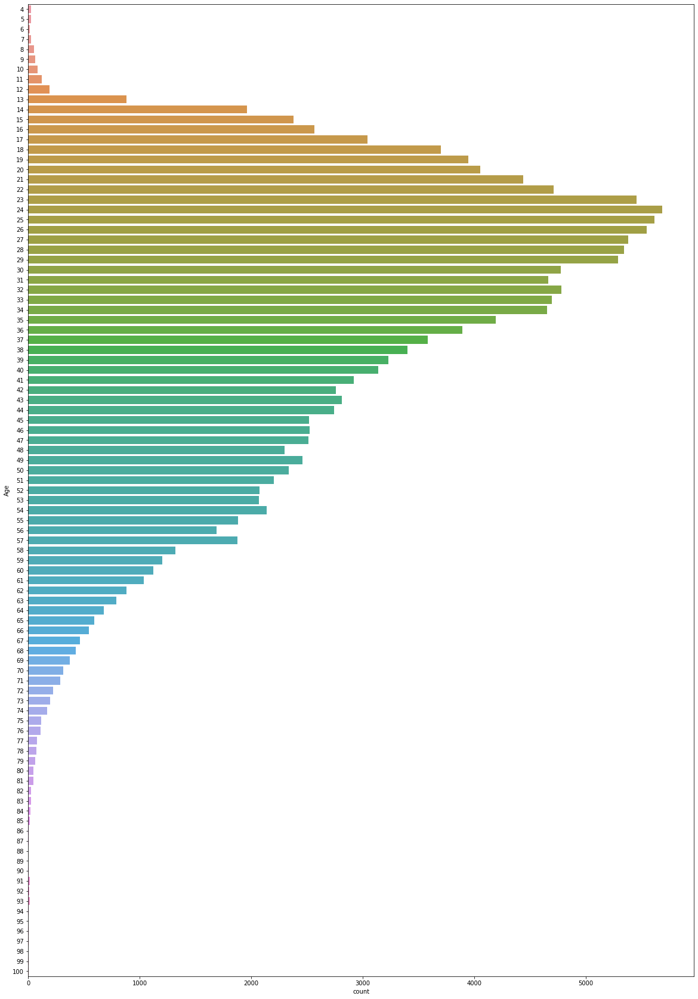

In [19]:
plt.figure(figsize=(20,30))
sns.countplot(data=books_data, y='Age');

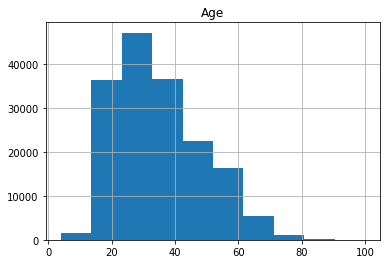

In [20]:
books_data.hist(column='Age');

In [21]:
books_data['Year-Of-Publication'].unique()

array([2001, 1991, 1999, 2000, 1993, 1996, 1988, 1998, 1994, 2003, 2004,
       1997, 2002, 1979, 1995, 1982, 1992, 1986, 1978, 1983, 1987, 1990,
       1981, 1989, 1984, 0, 1980, 1968, 1961, 1958, 1985, 1974, 1976,
       1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960, 1966,
       1920, 1956, 1959, 1953, 1942, 1963, 1964, 1969, 1954, 1950, 1967,
       2005, 1957, 1940, 1937, 1955, 1952], dtype=object)

*plot for the year of publication for each book*

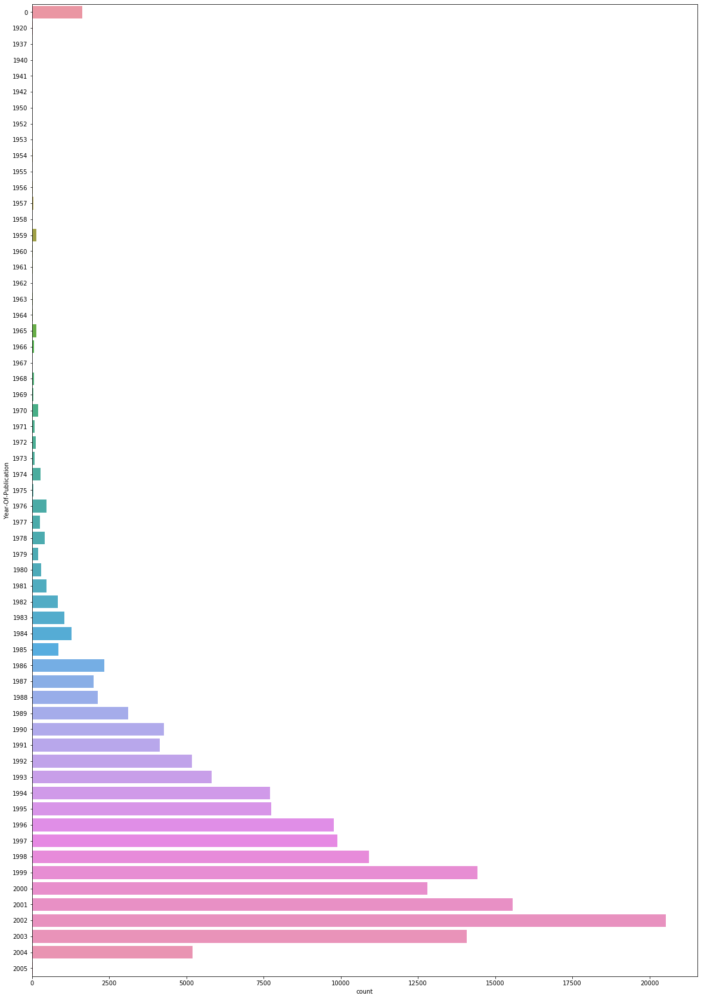

In [22]:
plt.figure(figsize=(20,30))
sns.countplot(data=books_data, y='Year-Of-Publication');

*the ratings represented from 1 to 10*

In [23]:
books_data['Book-Rating'].unique()

array([ 5,  8,  9,  0,  7,  6, 10,  4,  3,  2,  1])

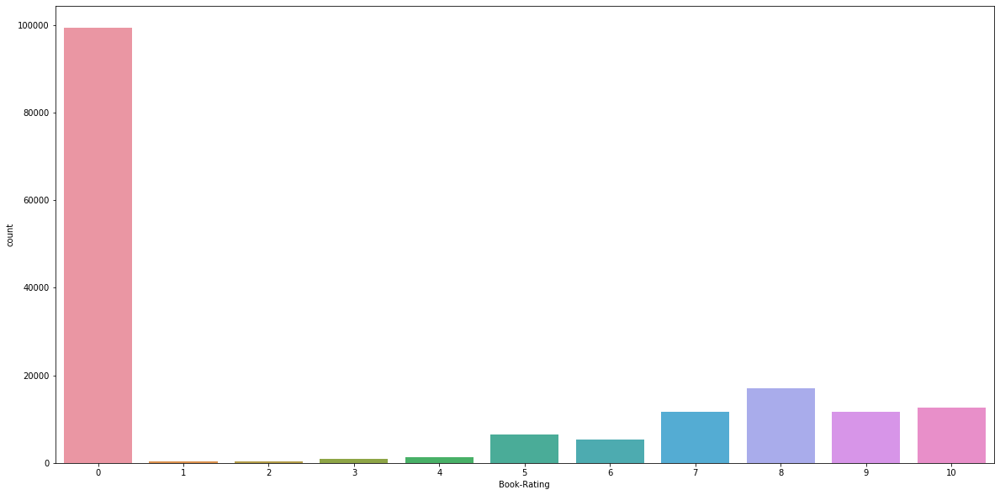

In [24]:
plt.figure(figsize=(20,10))
sns.countplot(data=books_data, x='Book-Rating')

**Taking the average rating of each book sorted in descending order of the average ratings** 

In [25]:
books_data.groupby('Book-Title')['Book-Rating'].mean().sort_values(ascending=False).head()

Book-Title
TROUBLE AT CAMP TREEHOUSE (NANCY DREW NOTEBOOK 7) : TROUBLE AT CAMP TREEHOUSE    10.0
And Not  Make Dreams Your Master                                                 10.0
Witchy Tarot                                                                     10.0
The Hunt Begins: The Great Hunt, Part 1 (The Wheel of Time, Book 2, Part 1)      10.0
Way Out West Lives a Coyote Named Frank (Picture Puffins)                        10.0
Name: Book-Rating, dtype: float64

**Taking the total number of ratings for each book**


**higher rating books**

In [26]:
books_data.groupby('Book-Title')['Book-Rating'].count().sort_values(ascending=False).head(15)

Book-Title
Wild Animus                                           1542
The Lovely Bones: A Novel                             736 
The Da Vinci Code                                     521 
A Painted House                                       501 
The Nanny Diaries: A Novel                            464 
Divine Secrets of the Ya-Ya Sisterhood: A Novel       425 
Angels &amp; Demons                                   422 
Bridget Jones's Diary                                 417 
Life of Pi                                            396 
Snow Falling on Cedars                                396 
The Red Tent (Bestselling Backlist)                   374 
The Secret Life of Bees                               369 
Where the Heart Is (Oprah's Book Club (Paperback))    364 
The Pelican Brief                                     364 
House of Sand and Fog                                 363 
Name: Book-Rating, dtype: int64

*turning the column names into lower case*

In [27]:
books_data.columns=books_data.columns.map(lambda x: (x.lower()))

## Exploratory Data Analysis 

In [28]:
books_data.head()

,isbn,book-title,book-author,year-of-publication,publisher,user-id,book-rating,age
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,18
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,11676,8,17
5,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,67544,8,61
9,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,123629,9,26
10,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,177458,0,14


In [29]:
books_data = books_data.rename(columns={'book-title': 'book_title','book-author':'book_author','year-of-publication':'year_of_publication',
                           'user-id':'user_id','book-rating':'book_rating'})

In [30]:
books_data.shape

(166876, 8)

In [31]:
books_data.columns

Index(['isbn', 'book_title', 'book_author', 'year_of_publication', 'publisher',
       'user_id', 'book_rating', 'age'],
      dtype='object')

*Check for the datatypes of each column*

In [32]:
books_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 166876 entries, 1 to 278854
Data columns (total 8 columns):
isbn                   166876 non-null object
book_title             166876 non-null object
book_author            166876 non-null object
year_of_publication    166876 non-null object
publisher              166876 non-null object
user_id                166876 non-null int64
book_rating            166876 non-null int64
age                    166876 non-null int64
dtypes: int64(3), object(5)
memory usage: 11.5+ MB


*Determine how many observations are missing*

In [33]:
books_data.isnull().sum()

isbn                   0
book_title             0
book_author            0
year_of_publication    0
publisher              0
user_id                0
book_rating            0
age                    0
dtype: int64

Describe the summary statistics for the columns

In [34]:
books_data.describe()

,user_id,book_rating,age
count,166876.000000,166876.000000,166876.000000
mean,135242.993834,3.127610,34.741479
std,82880.794123,3.960403,13.637723
min,8.000000,0.000000,4.000000
25%,61028.000000,0.000000,24.000000
50%,134500.000000,0.000000,32.000000
75%,208671.000000,7.000000,44.000000
max,278854.000000,10.000000,100.000000


#### Dataframe that contains the average rating of each book, book title, and book_rating

In [35]:
ratings_data = pd.DataFrame(books_data.groupby('book_title')['book_rating'].mean())

In [36]:
ratings_data ['rating_counts'] = pd.DataFrame(books_data.groupby('book_title')['book_rating'].count().sort_values(ascending=False))

In [37]:
ratings_data.reset_index().head()

,book_title,book_rating,rating_counts
0,Tales of Terror and Suspense,0.0,1
1,'48,0.0,3
2,'Salem's Lot,4.0,16
3,".NET Framework Essentials, 3rd Edition",0.0,1
4,01-01-00: A Novel of the Millennium,1.6,5


## Data Visualization


*The authors with most books*

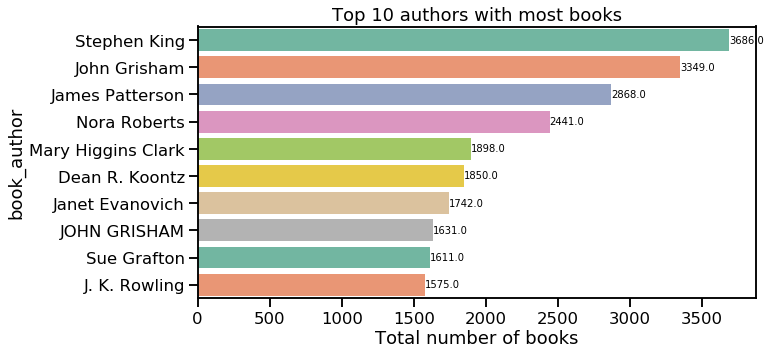

In [38]:
sns.set_context('talk')
most_books = books_data.groupby('book_author')['book_title'].count().reset_index().sort_values('book_title', ascending=False).head(10).set_index('book_author')
plt.figure(figsize=(10,5))
ax = sns.barplot(most_books['book_title'], most_books.index,palette='Set2')
ax.set_title("Top 10 authors with most books")
ax.set_xlabel("Total number of books")
for i in ax.patches:
    ax.text(i.get_width()+.3, i.get_y()+0.5, str(round(i.get_width())), fontsize = 10, color = 'k')


*The higher rating books*

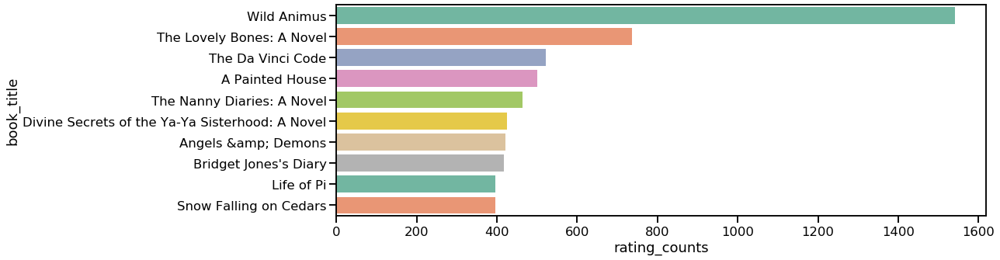

In [39]:
most_rated = ratings_data.sort_values('rating_counts', ascending = False).head(10)
plt.figure(figsize=(15,5))
sns.barplot(most_rated['rating_counts'], most_rated.index, palette='Set2');

*Rating distribution for the books*

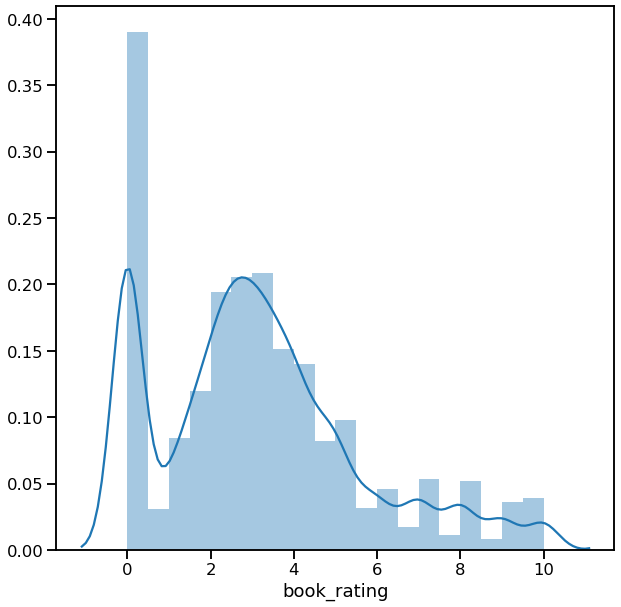

In [40]:
plt.figure(figsize=(10,10))
rating= ratings_data['book_rating'].astype(float)
sns.distplot(rating, bins=20);

## Recommender System

#### Finding Similarities Between Books
*convert the table to a 2D matrix, and fill the missing values*

In [41]:
rating_matrix =  books_data.pivot_table(index='book_title', columns='user_id', values='book_rating').fillna(0)

In [42]:
rating_matrix.head()

user_id,8,9,10,12,14,16,19,22,23,26,32,36,39,44,51,53,56,64,67,68,69,75,77,78,81,83,85,87,88,91,95,97,99,102,107,109,114,129,132,133,135,141,151,160,162,165,169,176,178,183,185,199,202,204,207,224,226,228,232,237,241,242,243,244,254,256,257,272,273,278,280,289,291,300,302,306,310,313,337,338,361,362,367,376,383,384,387,388,392,393,400,408,413,424,430,431,432,433,439,440,441,444,446,447,463,469,472,476,483,486,487,489,493,499,500,501,503,505,507,508,512,513,530,538,542,558,565,566,567,585,592,595,596,618,619,620,625,626,628,638,639,640,641,643,649,650,651,657,677,683,685,695,698,708,709,711,712,713,714,717,726,728,730,735,736,741,743,744,746,753,756,759,763,767,769,771,774,776,777,782,786,790,791,805,809,811,818,819,824,827,834,843,850,853,876,882,883,885,886,895,896,899,900,901,913,914,915,924,929,941,951,955,965,969,970,981,984,986,989,996,1003,1008,1009,1010,1012,1017,1019,1021,1022,1024,1025,1031,1048,1054,1057,1060,1063,1069,1075,1082,1083,1084,1087,1089,1093,1095,1096,1098,1108,1111,1113,1116,1118,1123,1124,1129,1131,1133,1137,1138,1140,1150,1155,1161,1164,1167,1169,1174,1178,1180,1184,1192,1200,1210,1211,1223,1225,1231,1233,1234,1235,1238,1248,1249,1254,1256,1258,1259,1261,1262,1264,1266,1270,1279,1281,1294,1297,1300,1309,1314,1317,1331,1332,1343,1348,1355,1360,1361,1368,1369,1372,1375,1376,1389,1395,1396,1399,1409,1412,1416,1424,1433,1434,1435,1436,1439,1442,1448,1461,1466,1467,1485,1487,1489,1491,1499,1500,1502,1504,1511,1513,1517,1521,1530,1533,1535,1539,1546,1547,1548,1554,1556,1558,1564,1569,1570,1573,1583,1585,1586,1596,1597,1608,1610,1615,1616,1617,1618,1619,1641,1650,1652,1653,1654,1660,1661,1674,1683,1684,1687,1688,1696,1703,1705,1706,1718,1719,1723,1725,1729,1730,1733,1745,1750,1762,1768,1773,1775,1782,1790,1791,1792,1793,1797,1799,1802,1805,1807,1809,1812,1813,1830,1838,1841,1844,1846,1848,1850,1859,1861,1863,1869,1878,1881,1888,1891,1898,1900,1901,1903,1905,1915,1918,1923,1928,1933,1937,1938,1948,1949,1951,1966,1971,1978,1986,1990,1995,1996,2009,2010,2012,2018,2019,2024,2030,2033,2036,2038,2041,2043,2045,2046,2060,2063,2066,2070,2074,2075,2078,2084,2087,2089,2090,2097,2103,2104,2105,2106,2109,2110,2115,2116,2127,2132,2134,2135,2136,2138,2139,2152,2155,2160,2163,2170,2172,2178,2179,2181,2183,2189,2190,2197,2203,2204,2222,2224,2230,2232,2238,2244,2250,2253,2268,2271,2275,2276,2281,2287,2288,2292,2295,2296,2302,2305,2308,2311,2312,2313,2324,2326,2333,2335,2337,2339,2340,2349,2350,2351,2352,2354,2358,2359,2363,2368,2375,2379,2385,2386,2389,2395,2399,2403,2404,2406,2411,2414,2415,2417,2436,2437,2439,2442,2448,2451,2455,2462,2466,2470,2473,2481,2482,2484,2485,2500,2501,2504,2508,2515,2531,2534,2540,2542,2545,2549,2550,2552,2559,2562,2569,2574,2578,2580,2584,2588,2589,2590,2591,2592,2596,2597,2599,2605,2611,2613,2615,2616,2618,2622,2630,2633,2634,2638,2640,2643,2644,2651,2653,2655,2656,2678,2679,2683,2687,2688,2696,2708,2718,2719,2729,2731,2738,2742,2744,2749,2759,2760,2766,2768,2769,2770,2771,2789,2790,2793,2799,2803,2804,2808,2830,2837,2844,2850,2853,2854,2855,2863,2864,2882,2883,2889,2891,2893,2896,2906,2907,2914,2933,2935,2936,2943,2945,2946,2948,2950,2954,2957,2966,2968,2974,2977,2982,2983,2995,2996,3003,3005,3009,3017,3020,3026,3027,3030,3039,3044,3048,3049,3052,3053,3054,3061,3062,3063,3067,3071,3073,3079,3087,3088,3089,3093,3094,3095,3099,3100,3101,3104,3106,3113,3114,3133,3141,3142,3145,3146,3148,3150,3154,3165,3167,3168,3174,3175,3177,3186,3191,3192,3193,3197,3200,3232,3243,3251,3260,3266,3268,3282,3283,3289,3291,3296,3300,3302,3305,3310,3315,3320,3321,3323,3326,3329,3331,3332,3344,3346,3347,3350,3355,3357,3362,3363,3364,3368,3371,3373,3374,3376,3379,3385,3393,3404,3416,3418,3421,3422,3427,3432,3437,3452,3460,3462,3463,3467,3471,3472,3477,3481,3488,3492,3495,3496,3508,3509,3510,3512,3514,3519,3528,3532,3537,3538,3542,3543,3544,3546,3547,3549,3556,3564,3569,3571,3573,3575,3578,3580,3583,3588,3593,3594,3596,3599,3601,3603,3605,3613,3615,3619,3622,3630,3633,3640,3641,3643,3648,3651,3652,3655,3656,3659,3660,36

In [43]:
rating_matrix.shape

(9240, 37013)

In [44]:
rating_matrix_features = csr_matrix(rating_matrix.values)

In [45]:
nn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
nn.fit(rating_matrix_features)

NearestNeighbors(algorithm='brute', leaf_size=30, metric='cosine',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

*testing and making some recommendations*

*knn calculate the distance between the target book and the other books in the dataset, then rank its distance
and return the top k-nearest neighbor books, as the most similar book recomandations*

In [46]:
query_index = np.random.choice(rating_matrix.shape[0])
distances, indices = nn.kneighbors(np.asarray(rating_matrix.iloc[query_index, :]).reshape(1,-1),n_neighbors = 10)

for i in range(0, len(distances.flatten())):
    if i == 0:
        print ('Recommendations for {0}:\n'.format(rating_matrix.index[query_index]))
    else:
        print ('{0}: {1}, with distance of {2}:'.format(i, rating_matrix.index[indices.flatten()[i]], distances.flatten()[i]))

Recommendations for Poet and Dancer:

1: Stranger in a Strange Land (Remembering Tomorrow), with distance of 1.0:
2: Strange Bedpersons, with distance of 1.0:
3: Strange Fits of Passion: A Novel, with distance of 1.0:
4: Strange Memories The Nancy Drew Files 122 (Nancy Drew Files (Paperback)), with distance of 1.0:
5: Strange True Stories of Louisiana, with distance of 1.0:
6: Strange but True, with distance of 1.0:
7: Stranger Is Watching, with distance of 1.0:
8: Straight Man : A Novel (Vintage Contemporaries), with distance of 1.0:
9: Strata, with distance of 1.0:


## Conclusions and Recommendations

Recommender systems have their origins in a variety of areas of research, including information retrieval, information filtering, text classification.
The goal of this project was to build a recommender system for books based on collaborative filtering , using Book-Crossing Dataset. The features used for the model is user_id ,book_rating ,and book_title, the other features can be used with the existence of other features such as genres, language of the book, etc.
A knn algorithm was built to find clusters of similar users based on common book ratings, 
Finally a recommender system was built to predict 10 book titles to be rated the same by a given user.